# MNISET
This notebook shows how to load the [MNISET](https://github.com/wouterkool/MNISET) dataset that was created as a side-effect of creating the [SET Finder](https://www.set-finder.com) app.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os

## Load the data

In [2]:
# Not that pretty but this way you just need this code
if not os.path.isfile('mniset.py'):
    from urllib import request
    request.urlretrieve('https://github.com/wouterkool/MNISET/raw/master/mniset.py', 'mniset.py')

In [3]:
from mniset import load_mniset, extract_dataset, extract_grayscale_dataset

mniset = load_mniset()
x_train, y_train, labels, label_imgs = extract_dataset(mniset, split='train')
x_test, y_test, *_ = extract_dataset(mniset, split='test')

print(len(x_train), " train images, ", len(x_test), "test images")
print("x_train.shape", x_train.shape)
print("x_train range", [x_train.min(), x_train.max()])
print("y_train.shape", y_train.shape)

3036  train images,  922 test images
x_train.shape (3036, 28, 28, 3)
x_train range [0.0, 1.0]
y_train.shape (3036,)


## Plot random samples

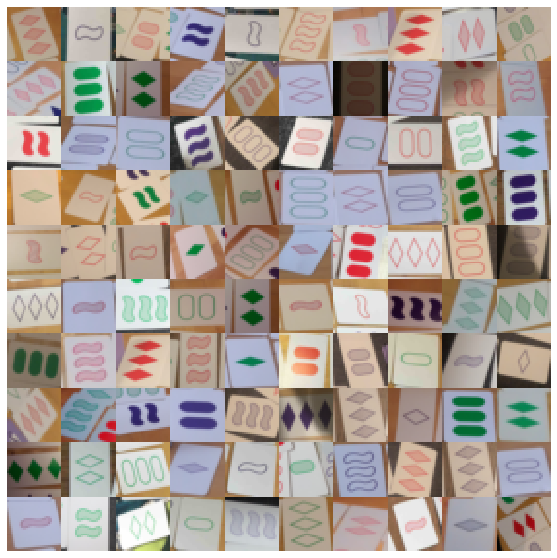

In [4]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def tile(imgs, n=20):
    return np.vstack([np.hstack(img_chunk) for img_chunk in chunks(imgs, n)])

def plot_sample(x):
    nrows = int(np.sqrt(len(x)) + 0.5)
    ncols = len(x) // nrows + (1 if len(x) % nrows != 0 else 0)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(tile(x, ncols), cmap='gray' if x.ndim == 3 else None)
    plt.axis('off')
    plt.show()
    
sample_idx = np.random.choice(len(x_train), 100)
plot_sample(x_train[sample_idx])

## Plot random samples per class

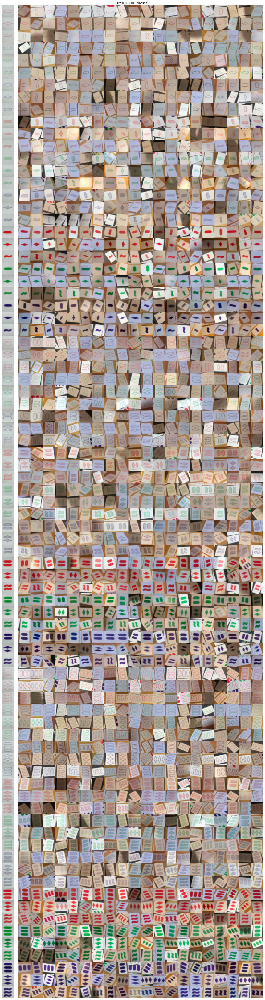

In [5]:
def plot_per_class(x, y, label_imgs, max_per_class=20, title=''):
    rows = []
    max_per_class = min(max_per_class, np.bincount(y).max())
    for i, label_img in enumerate(label_imgs):
        idx = np.where(y == i)[0]
        idx = np.random.choice(idx, min(max_per_class, len(idx)), replace=False)
        x_i = x[idx]
        x_i = np.pad(x_i, ((0, max_per_class - len(x_i)),) + ((0, 0),) * (x.ndim - 1), mode='constant', constant_values=1)
        rows.append(np.hstack((label_img, np.ones_like(label_img[:, :10]), *x_i)))

    fig, ax = plt.subplots(figsize=(20, 20 / (max_per_class + 1) * len(label_imgs)))
    imggrid = np.vstack(rows)
    ax.imshow(imggrid, cmap='gray' if imggrid.ndim == 2 else None)
    plt.axis('off')
    plt.title(f"{title} ({len(label_imgs)} classes)")
    plt.show()
    
plot_per_class(x_train, y_train, label_imgs, max_per_class=20, title='Train SET')

## Plot frequencies of classes

Train , num classes 81 , min freq. 20 , max freq. 57 , avg freq. 37.48148148148148


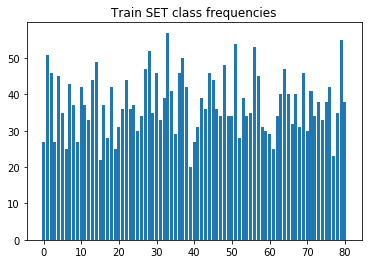

Test , num classes 81 , min freq. 2 , max freq. 23 , avg freq. 11.382716049382717


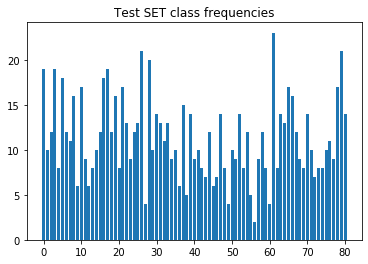

In [6]:
def plot_frequencies(y, num_classes=None, title='MNISET'):
    
    freq = np.bincount(y)
    if num_classes is None:
        num_classes = len(freq)
    else:
        assert len(freq) == num_classes
    assert (freq > 0).all()
    print(title.title(),
          ", num classes", num_classes, 
          ", min freq.", freq.min(), 
          ", max freq.", freq.max(), 
          ", avg freq.", freq.mean())
    plt.bar(np.arange(num_classes), freq)
    plt.title("{} SET class frequencies".format(title.title()))
    plt.show()

plot_frequencies(y_train, len(labels), title='Train')
plot_frequencies(y_test, len(labels), title='Test')

## Plot class 'label images'
The dataset comes with a clean example 'label image' for each class, as well as a string label.

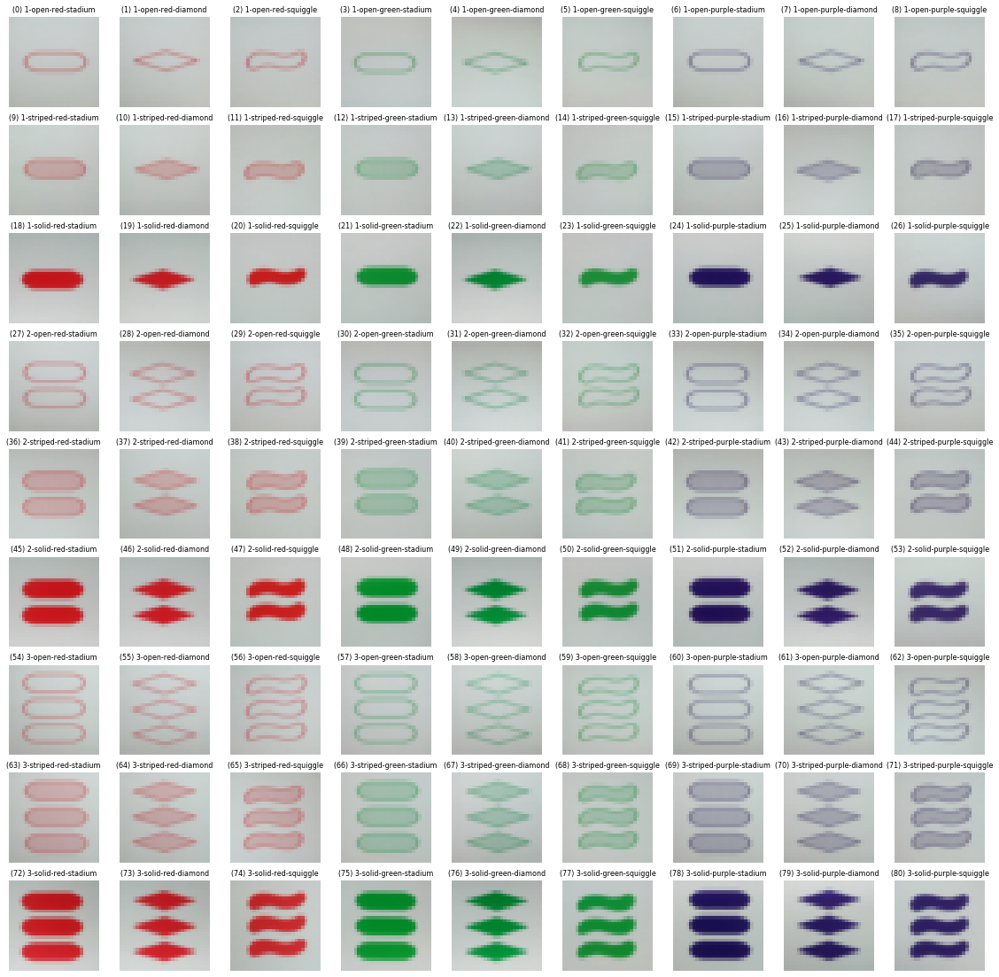

In [7]:
def plot_classes(label_imgs, labels, title=None):
    num_classes = len(labels)
    cols = 9 if num_classes > 9 else 3
    rows = num_classes // cols
    assert num_classes % cols == 0
    fig, axarr = plt.subplots(rows, cols, figsize=(cols * 2.2, rows * 2.2))
    for i, (label_img, label) in enumerate(zip(label_imgs, labels)):
        row, col = i // cols, i % cols
        ax = axarr[row, col] if rows > 1 else axarr[col]
        ax.imshow(label_img, cmap='gray' if label_img.ndim == 2 else None)
        ax.set_title(f'({i}) {label}', fontsize=8)
        ax.axis('off')
    if title is not None:
        plt.suptitle(title, y=1.02)
    plt.show()

plot_classes(label_imgs, labels)

## Grayscale MNISET
We can make a grayscale MNISET dataset just like the original MNIST dataset, using `extract_grayscale_dataset`. By default, this will also remove the color feature from the classes for a classification problem with 27 classes. To address the full 81 class problem with the grayscale dataset, add `color=True` (not recommended).

Train (Grayscale) , num classes 27 , min freq. 79 , max freq. 150 , avg freq. 112.44444444444444


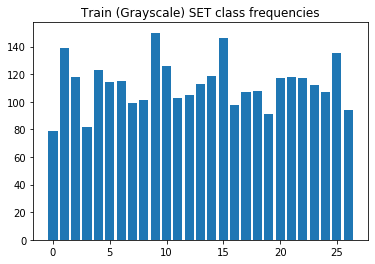

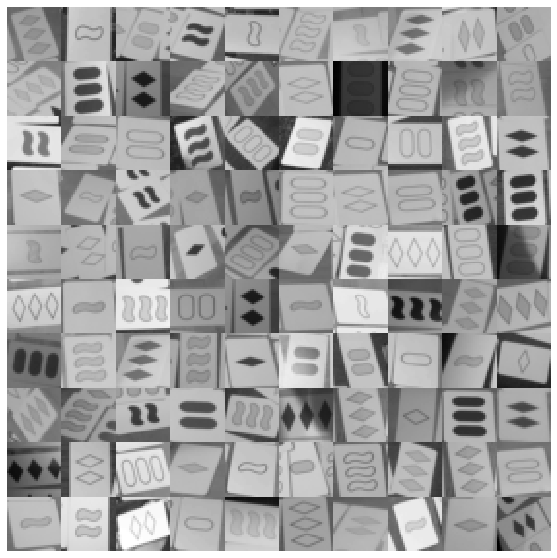

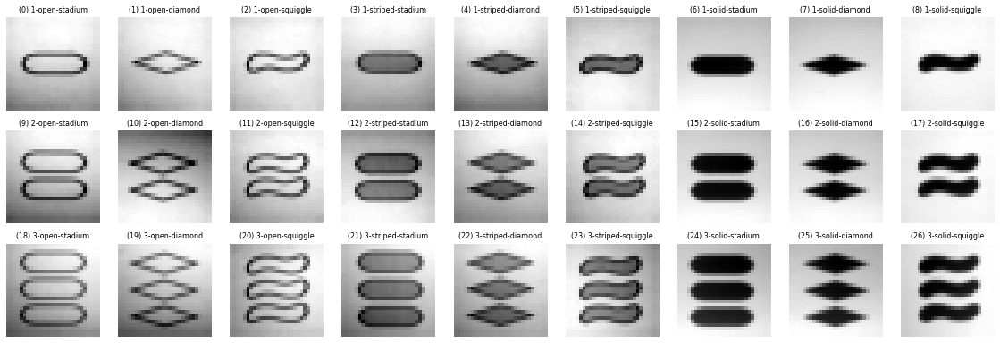

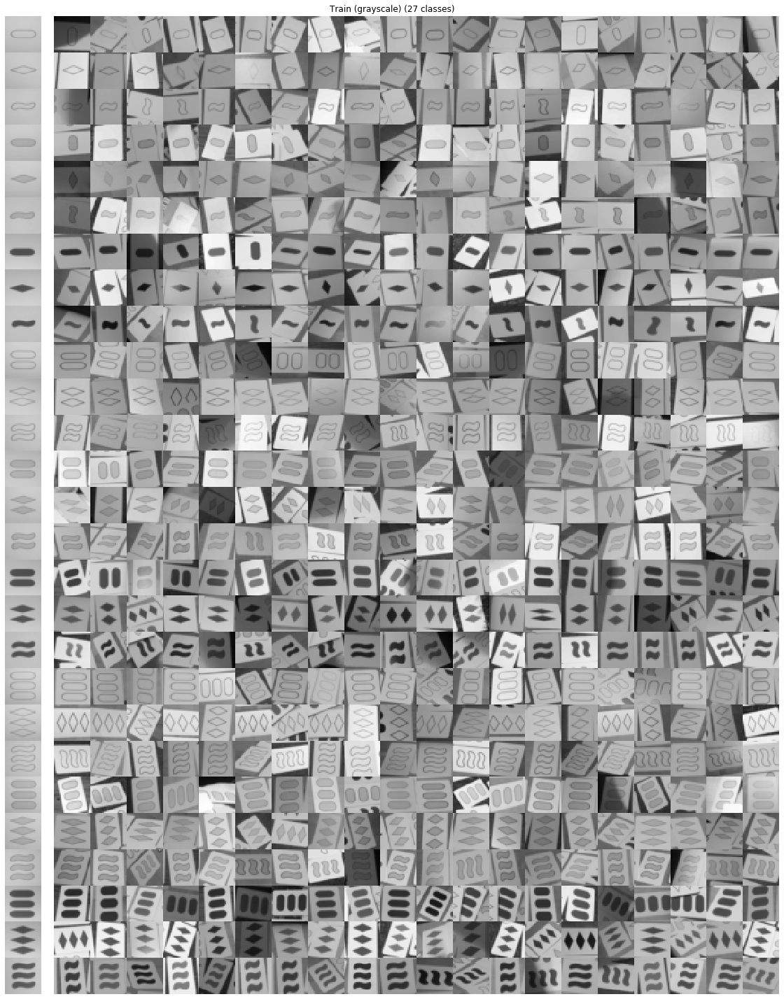

In [8]:
x_train_gray, y_train_gray, labels_gray, label_imgs_gray = extract_grayscale_dataset(mniset)

# x_test_gray, y_test_gray, *_ = extract_grayscale_dataset(mniset, split='test')

plot_frequencies(y_train_gray, len(labels_gray), title='Train (grayscale)')

plot_sample(x_train_gray[sample_idx])

plot_classes(label_imgs_gray, labels_gray)

plot_per_class(x_train_gray, y_train_gray, label_imgs_gray, max_per_class=20, title='Train (grayscale)')

## Simplified datasets
Just like we (by default) removed the color feature from the classes when using the grayscale dataset, we can remove other features to simplify the classification problem, by using `qty=False`, `fill=False`, `color=False` or `shape=False`.

Train (Simple) , num classes 9 , min freq. 276 , max freq. 401 , avg freq. 337.3333333333333


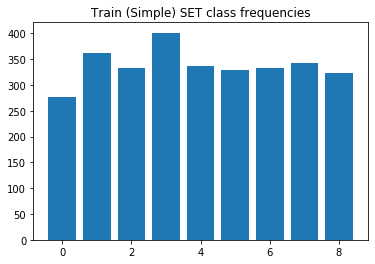

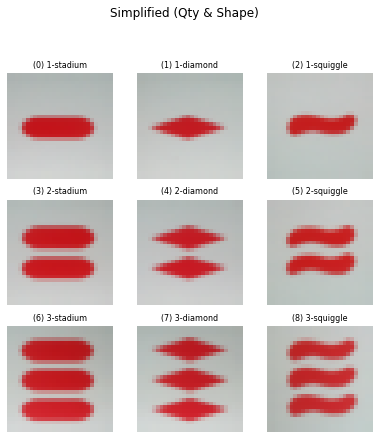

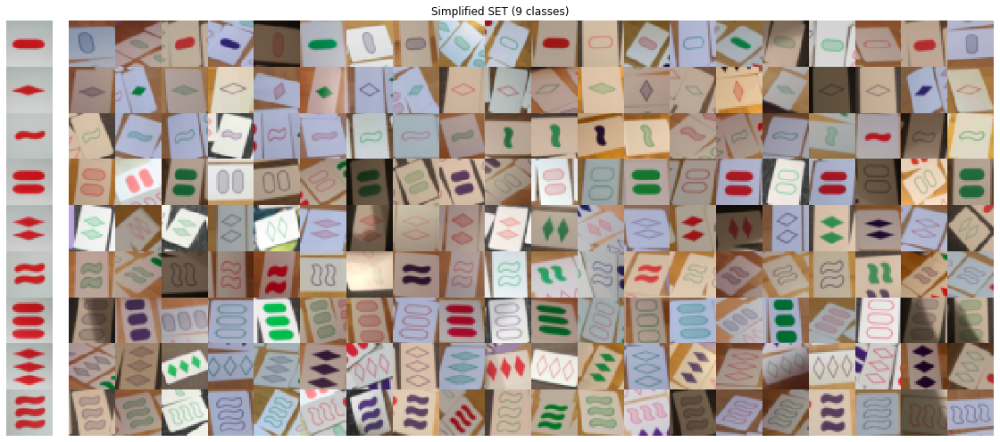

In [9]:
# Only use 9 classes based on qty and shape by disabling fill and color
x_train_simple, y_train_simple, labels_simple, label_imgs_simple = \
    extract_dataset(mniset, fill=False, color=False)

# Note that this does not affect the imput data, only the labels!
assert (x_train_simple == x_train).all()

plot_frequencies(y_train_simple, len(labels_simple), title='Train (simple)')

# For the 'label images', the other features will have default values (e.g. solid red)!
plot_classes(label_imgs_simple, labels_simple, title='Simplified (Qty & Shape)')

plot_per_class(x_train, y_train_simple, label_imgs_simple, title='Simplified SET')

## Plot full dataset

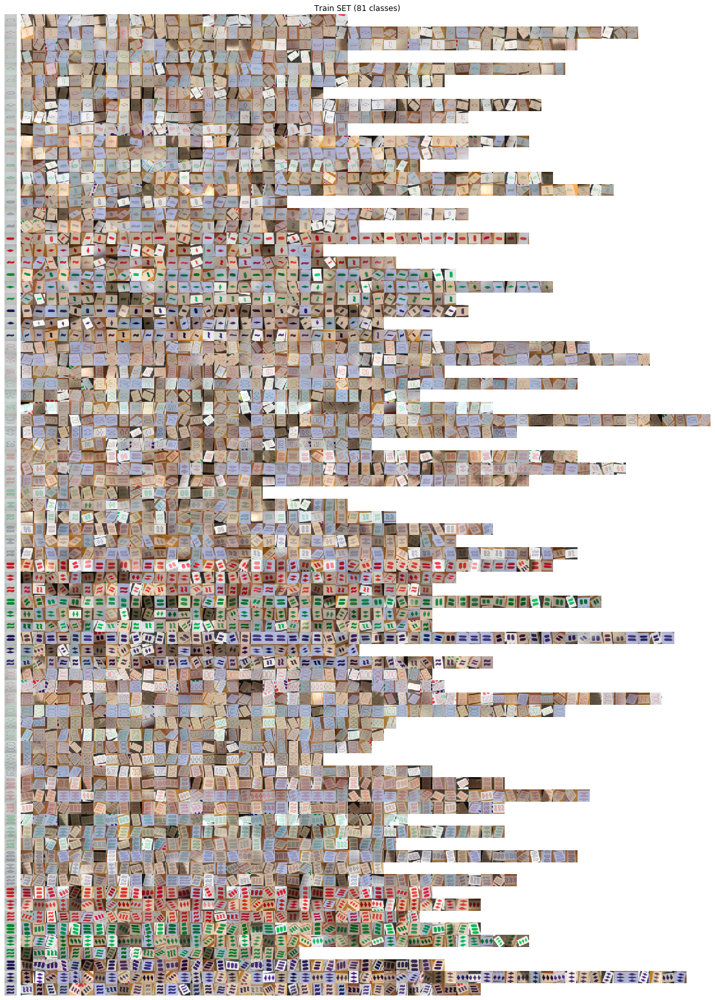

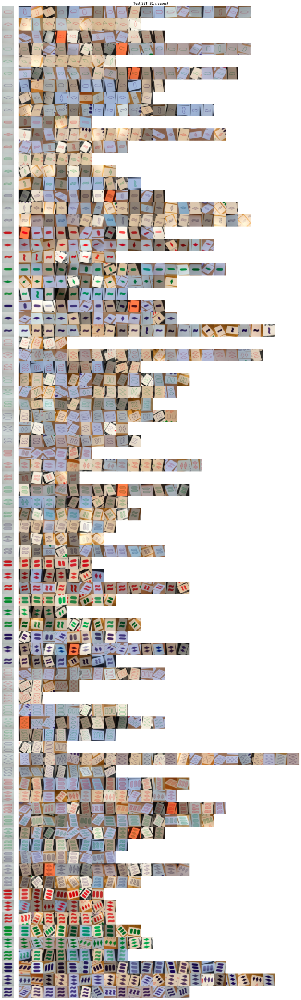

In [10]:
plot_per_class(x_train, y_train, label_imgs, max_per_class=10000, title='Train SET')
plot_per_class(x_test, y_test, label_imgs, max_per_class=10000, title='Test SET')